Диплом Айзатулин А. DS-44. Модель 1.

In [ ]:
!pip install xmltodict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.datasets import load_files
from keras.utils import np_utils

from tqdm import tqdm

import xml.etree.ElementTree
import os
from glob import glob

import xmltodict 
import pprint 
import json
from matplotlib import pyplot as plt
from random import shuffle

from operator import itemgetter
from scipy import spatial


print(tf.__version__)

2.11.0


Чтение XML файлов.

In [ ]:
from matplotlib.widgets import Rectangle
IMAGE_PATH = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/images/'

def load_boxes(test_size = 0.05):
  p_xml = glob('/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/annotations/*.xml')
#shuffle(p_xml)
  nom = int(test_size * len(p_xml))
  boxes_train = load_annotations(p_xml[nom:])
  boxes_test = load_annotations(p_xml[:nom])
  return boxes_train, boxes_test


def load_annotations(paths):
  boxes = dict()
  for path in paths:
    with open(path) as fd: 
      #print (path)
      annotation = xmltodict.parse(fd.read())['annotation']
      rectangles = dict()
      elem = dict()
      elem['filename'] = IMAGE_PATH + annotation['filename']
      try:
        rect = []
        if isinstance(annotation['object'], dict):
          annotation['object'] = [annotation['object']] 
        for an_obj in annotation['object']:
          rectangles = dict()
          rectangles['x'] = int(an_obj['bndbox']['xmin'])+(int(an_obj['bndbox']['xmax']) - int(an_obj['bndbox']['xmin']))/2
          rectangles['y'] = int(an_obj['bndbox']['ymin'])+(int(an_obj['bndbox']['ymax']) - int(an_obj['bndbox']['ymin']))/2
          rectangles['width'] = int(an_obj['bndbox']['xmax']) - int(an_obj['bndbox']['xmin'])
          rectangles['height'] = int(an_obj['bndbox']['ymax']) - int(an_obj['bndbox']['ymin'])
          rectangles['name'] = an_obj['name']
          rect.append(rectangles)
      except:
          rectangles = dict()
          rectangles['x'] = 0
          rectangles['y'] = 0
          rectangles['width'] = 0
          rectangles['height'] = 0
          rectangles['name'] = None
          rect.append(rectangles)
      elem['rect'] = rect
      boxes[annotation['filename']] = elem
  return boxes


In [ ]:
boxes_train, boxes_test = load_boxes()
print (len(boxes_train), len(boxes_test))

2895 152


In [ ]:
box = boxes_train['03002.jpg']
box

{'filename': '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/images/03002.jpg',
 'rect': [{'x': 198.0,
   'y': 256.0,
   'width': 74,
   'height': 88,
   'name': 'brick_2x4'},
  {'x': 111.0, 'y': 159.0, 'width': 38, 'height': 46, 'name': 'brick_2x2'},
  {'x': 173.0, 'y': 89.5, 'width': 28, 'height': 71, 'name': 'plate_2x4'},
  {'x': 62.5, 'y': 34.5, 'width': 35, 'height': 69, 'name': 'brick_1x6'}]}

In [ ]:
type_brick = [n['name'] for t in boxes_train.values() for n in t['rect']]
type_brick[:5]

['brick_2x4', 'brick_1x6', 'brick_2x2', 'plate_1x2', 'brick_1x6']

In [ ]:
for word in set(type_brick):
    print(f'{word}: {type_brick.count(word)}')

plate_1x2: 1557
None: 15
brick_2x2: 1454
plate_2x2: 1533
plate_2x4: 1511
brick_1x6: 1525
brick_2x4: 1503


Прорисовка детекции.

In [ ]:
def draw_boxes(Boxes, rectangles=None, image_size=None):
    
    def _draw(img, rectangles, scale_x, scale_y, color=(0, 255, 0)):
        for rect in rectangles:
          pt1 = (int((rect['x'] - rect['width'] / 2) * scale_x),
                  int((rect['y'] - rect['height'] / 2) * scale_y))
          pt2 = (int((rect['x'] + rect['width'] / 2) * scale_x),
                  int((rect['y'] + rect['height'] / 2) * scale_y))
          img = cv2.rectangle(img.copy(), pt1, pt2, 
                                color=color, thickness=1)
        return img
    
    scale_x, scale_y = 1., 1.
    
    img = cv2.imread(Boxes['filename'], cv2.IMREAD_COLOR)[...,::-1]
    if image_size is not None:
        scale_x = 1. * image_size[0] / img.shape[1]
        scale_y = 1. * image_size[1] / img.shape[0]
        img = cv2.resize(img, image_size)
        
    #if annotation['rect'] is not None:
    img = _draw(img, Boxes.get('rect', []), scale_x, scale_y)
    
    if rectangles is not None:
        img = _draw(img, rectangles, 1., 1., (255, 0, 0))

    return img

Вырезка боксов и сохранение в файл.

In [ ]:
# вывод в JPG обнаруженных сегментов без изменений (для TEST)
def crop_save(Boxes, rectangles=None, image_size=None):
    
    scale_x, scale_y = 1., 1.
    img = cv2.imread(Boxes['filename'], cv2.IMREAD_COLOR)#[...,::-1]
    if image_size is not None:
        scale_x = 1. * image_size[0] / img.shape[1]
        scale_y = 1. * image_size[1] / img.shape[0]
        img = cv2.resize(img, image_size)

    if rectangles is not None:
      for i, rect in enumerate(rectangles):
          x_0 = int((rect['x'] - rect['width'] / 2) * scale_x)
          y_0 = int((rect['y'] - rect['height'] / 2) * scale_y)
          x_1 = int((rect['x'] + rect['width'] / 2) * scale_x)
          y_1 = int((rect['y'] + rect['height'] / 2) * scale_y)
          brick_type = annotation['rect'][i].setdefault('name', '')
          img_crop = img[ y_0:y_1, x_0:x_1]
          file_name = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_' \
            +brick_type + '_' + str(i) + '_' + os.path.basename(Boxes['filename'])
          
          cv2.imwrite(file_name, img_crop)
    
    return i+1

### Валидация энкодинга/декодинга якорей

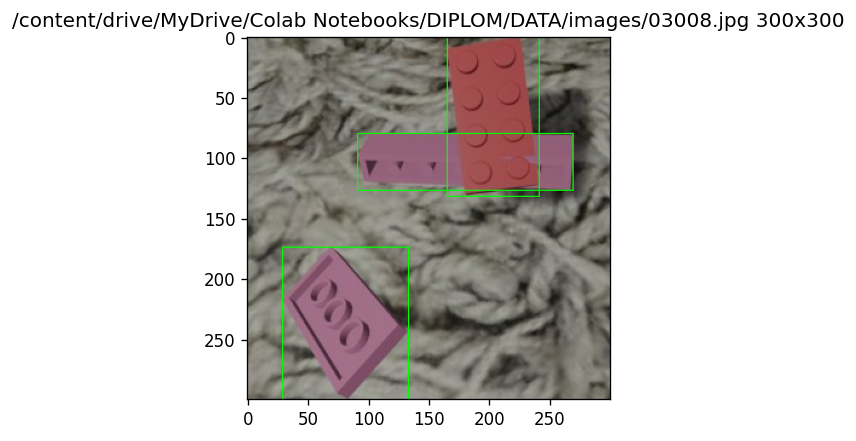

In [ ]:
box = boxes_train['03008.jpg']
img = draw_boxes(box)

plt.figure(figsize=(4, 4), dpi=120)
plt.imshow(img)
plt.title('{} {}x{}'.format(
    box['filename'], img.shape[0], img.shape[1]));

In [ ]:
from tensorflow.keras.applications import vgg16

IMG_HEIGHT = 300
IMG_WIDTH = 300

features = vgg16.VGG16(weights='imagenet',
                       include_top=False,
                       input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# дообучаем последние 5 слоев
for layer in features.layers[:-5]:
    layer.trainable = False
    
feature_tensor = features.layers[-1].output
#feature_tensor = tf.keras.layers.Dropout(0.5)(feature_tensor)

print(feature_tensor.shape)

58889256/58889256 [==============================] - 2s 0us/step
(None, 9, 9, 512)


In [ ]:
FEATURE_SHAPE = (feature_tensor.shape[1],
                 feature_tensor.shape[2])

GRID_STEP_H = IMG_HEIGHT / FEATURE_SHAPE[0]
GRID_STEP_W = IMG_WIDTH / FEATURE_SHAPE[1]

ANCHOR_WIDTH = 5.
ANCHOR_HEIGHT = 5. 

# сетка якорей, размер определяется соотношением 
# размера входного изображения и размером тензора признаков
ANCHOR_CENTERS = np.mgrid[GRID_STEP_H/2:IMG_HEIGHT:GRID_STEP_H,
                          GRID_STEP_W/2:IMG_WIDTH:GRID_STEP_W]

In [ ]:
def iou(rect, x_scale, y_scale, anchor_x, anchor_y,
        anchor_w=ANCHOR_WIDTH, anchor_h=ANCHOR_HEIGHT):
    
    rect_x1 = (rect['x'] - rect['width'] / 2) * x_scale
    rect_x2 = (rect['x'] + rect['width'] / 2) * x_scale
    
    rect_y1 = (rect['y'] - rect['height'] / 2) * y_scale
    rect_y2 = (rect['y'] + rect['height'] / 2) * y_scale
    
    anch_x1, anch_x2 = anchor_x - anchor_w / 2, anchor_x + anchor_w / 2
    anch_y1, anch_y2 = anchor_y - anchor_h / 2, anchor_y + anchor_h / 2
    
    dx = (min(rect_x2, anch_x2) - max(rect_x1, anch_x1))
    dy = (min(rect_y2, anch_y2) - max(rect_y1, anch_y1))
    
    intersection = dx * dy if (dx > 0 and dy > 0) else 0.
    
    anch_square = (anch_x2 - anch_x1) * (anch_y2 - anch_y1)
    rect_square = (rect_x2 - rect_x1) * (rect_y2 - rect_y1)
    union = anch_square + rect_square - intersection
    
    return intersection / union

def encode_anchors(annotation, img_shape, iou_thr=0.5):
    encoded = np.zeros(shape=(FEATURE_SHAPE[0],
                              FEATURE_SHAPE[1], 5), dtype=np.float32)
    x_scale = 1. * IMG_WIDTH / img_shape[1]
    y_scale = 1. * IMG_HEIGHT / img_shape[0]
    if annotation['rect'] is not None:
      for rect in annotation['rect']:
        scores = []
        for row in range(FEATURE_SHAPE[0]):
            for col in range(FEATURE_SHAPE[1]):
                anchor_x = ANCHOR_CENTERS[1, row, col]
                anchor_y = ANCHOR_CENTERS[0, row, col]
                score = iou(rect, x_scale, y_scale, anchor_x, anchor_y)
                scores.append((score, anchor_x, anchor_y, row, col))
        
        scores = sorted(scores, reverse=True)
        if scores[0][0] < iou_thr:
            scores = [scores[0]]  # default anchor
        else:
            scores = [e for e in scores if e[0] > iou_thr]

        for score, anchor_x, anchor_y, row, col in scores:
            dx = (anchor_x - rect['x'] * x_scale) / ANCHOR_WIDTH
            dy = (anchor_y - rect['y'] * y_scale) / ANCHOR_HEIGHT
            dw = (ANCHOR_WIDTH - rect['width'] * x_scale) / ANCHOR_WIDTH
            dh = (ANCHOR_HEIGHT - rect['height'] * y_scale) / ANCHOR_HEIGHT
            encoded[row, col] = [1., dx, dy, dw, dh]
    else:
       encoded = None       
    return encoded

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def decode_prediction(prediction, conf_thr=0.1):
  if prediction is not None:
    rectangles = []
    for row in range(FEATURE_SHAPE[0]):
        for col in range(FEATURE_SHAPE[1]):
            logit, dx, dy, dw, dh = prediction[row, col]
            conf = _sigmoid(logit)
            if conf > conf_thr:
                anchor_x = ANCHOR_CENTERS[1, row, col]
                anchor_y = ANCHOR_CENTERS[0, row, col]
                rectangles.append({'x': anchor_x - dx * ANCHOR_WIDTH,
                                   'y': anchor_y - dy * ANCHOR_HEIGHT,
                                   'width': ANCHOR_WIDTH - dw * ANCHOR_WIDTH,
                                   'height': ANCHOR_HEIGHT - dh * ANCHOR_HEIGHT,
                                   'conf': conf})
    return rectangles
  else:
    rectangles.append({'x': 0,
                    'y': 0,
                    'width': 0,
                    'height': 0,
                    'conf': conf})
    return rectangles

def non_max_suppression(rectangles, max_output_size, iou_threshold=0.5):
    if not rectangles:
        return rectangles
    
    boxes = [[r['y'],
              r['x'],
              r['y'] + r['height'],
              r['x'] + r['width']] for r in rectangles]
    scores = [r['conf'] for r in rectangles]
    indices = tf.image.non_max_suppression(np.array(boxes),
                                           np.array(scores),
                                           max_output_size,
                                           iou_threshold)
    
    return [rectangles[i] for i in indices]

[{'x': 203.0, 'y': 66.0, 'width': 76, 'height': 132, 'name': 'brick_2x4'}, {'x': 81.0, 'y': 237.0, 'width': 104, 'height': 126, 'name': 'plate_2x4'}, {'x': 180.0, 'y': 103.5, 'width': 178, 'height': 47, 'name': 'brick_1x6'}]
[{'x': 202.99999992052713, 'y': 66.00000063578288, 'width': 75.99999904632568, 'height': 131.99999809265137, 'conf': 0.7310585896677003}, {'x': 180.0, 'y': 103.49999944368999, 'width': 177.99999237060547, 'height': 46.99999809265137, 'conf': 0.7310585896677003}, {'x': 81.00000063578288, 'y': 237.0000012715658, 'width': 103.99999618530273, 'height': 126.00000381469727, 'conf': 0.7310585896677003}]


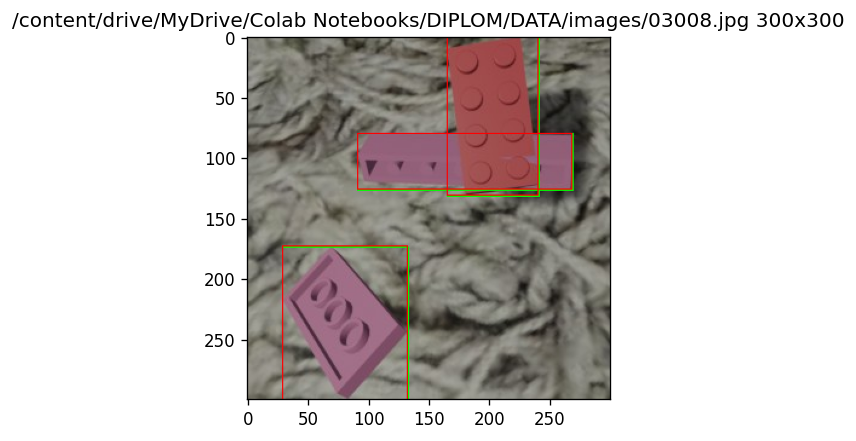

In [ ]:
annotation = boxes_train['03008.jpg']
print (annotation['rect'])

encoded = encode_anchors(annotation,
                         img_shape=(IMG_HEIGHT, IMG_WIDTH),
                         iou_thr=0.5)

decoded = decode_prediction(encoded, conf_thr=0.7)
print (decoded)
decoded = sorted(decoded, key = lambda e: -e['conf'])

plt.figure(figsize=(4, 4), dpi=120)
plt.imshow(draw_boxes(annotation, decoded))
plt.title('{} {}x{}'.format(
    annotation['filename'], img.shape[0], img.shape[1]));

#crop_save(annotation, decoded)

## Функция потерь

In [ ]:
K = tf.keras.backend

def confidence_loss(y_true, y_pred):
    conf_loss = K.binary_crossentropy(y_true[..., 0], 
                                      y_pred[..., 0],
                                      from_logits=True)
    return conf_loss

def smooth_l1(y_true, y_pred):
    abs_loss = K.abs(y_true[..., 1:] - y_pred[..., 1:])
    square_loss = 0.5 * K.square(y_true[..., 1:] - y_pred[..., 1:])
    mask = K.cast(K.greater(abs_loss, 1.), 'float32')
    total_loss = (abs_loss - 0.5) * mask + 0.5 * square_loss * (1. - mask)
    return K.sum(total_loss, axis=-1)

def total_loss(y_true, y_pred, neg_pos_ratio=3):
    batch_size = K.shape(y_true)[0]
    
    y_true = K.reshape(y_true, (batch_size, -1, 5))
    y_pred = K.reshape(y_pred, (batch_size, -1, 5))

    # confidence loss
    conf_loss = confidence_loss(y_true, y_pred)
    
    # smooth l1 loss
    loc_loss = smooth_l1(y_true, y_pred)
    
    # positive examples loss
    pos_conf_loss = K.sum(conf_loss * y_true[..., 0], axis=-1)
    pos_loc_loss = K.sum(loc_loss * y_true[..., 0], axis=-1)
    
    # negative examples loss
    anchors = K.shape(y_true)[1]
    num_pos = K.sum(y_true[..., 0], axis=-1)
    num_pos_avg = K.mean(num_pos)
    num_neg = K.min([neg_pos_ratio * (num_pos_avg) + 1., K.cast(anchors, 'float32')])
    
    # hard negative mining
    neg_conf_loss, _ = tf.nn.top_k(conf_loss * (1. - y_true[..., 0]),
                                   k=K.cast(num_neg, 'int32'))

    neg_conf_loss = K.sum(neg_conf_loss, axis=-1)
    
    # total conf loss
    total_conf_loss = (neg_conf_loss + pos_conf_loss) / (num_neg + num_pos + 1e-32)
    loc_loss = pos_loc_loss / (num_pos + 1e-32)
    
    return total_conf_loss + 0.5 * loc_loss

# Загрузка изображений

In [ ]:
from random import shuffle

def load_img(path, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    img = cv2.imread(path, cv2.IMREAD_COLOR)[...,::-1]
    img_shape = img.shape
    img_resized = cv2.resize(img, target_size)
    return img_shape, vgg16.preprocess_input(img_resized.astype(np.float32))

def data_generator(boxes, batch_size=32):
    #boxes = sum(boxes.values(), [])
    boxes = list(boxes.values())
    while True:
        shuffle(boxes)
        for i in range(len(boxes)//batch_size):
            X, y = [], []
            for j in range(i*batch_size,(i+1)*batch_size):
#                print (boxes[j]['filename'])
                img_shape, img = load_img(boxes[j]['filename'])
                y.append(encode_anchors(boxes[j], img_shape))
                X.append(img)
            #print (X)
            #print (y)
            yield np.array(X), np.array(y)

def test_generator(boxes):
    X = []
    for annotation in tqdm(boxes.values()):
    #annotation = boxes.values()
      #print (annotation)
      _, sample_img = load_img(annotation['filename'])
      X.append(sample_img)
      #print (sample_img.shape)
    yield np.array(X)

In [ ]:
boxes_train['00452.jpg']

{'filename': '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/images/00452.jpg',
 'rect': [{'x': 186.0,
   'y': 89.0,
   'width': 48,
   'height': 42,
   'name': 'brick_2x2'},
  {'x': 13.0, 'y': 155.5, 'width': 26, 'height': 45, 'name': 'plate_2x2'},
  {'x': 257.5, 'y': 196.5, 'width': 85, 'height': 65, 'name': 'plate_2x4'},
  {'x': 40.0, 'y': 169.0, 'width': 18, 'height': 32, 'name': 'plate_1x2'}]}

## Добавляем выход детектора

In [ ]:
output = tf.keras.layers.BatchNormalization()(feature_tensor)

output = tf.keras.layers.Conv2D(5,
                                kernel_size=(1, 1), 
                                activation='linear',
                                kernel_regularizer='l2')(output)

model = tf.keras.models.Model(inputs=features.inputs, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 300, 300, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 300, 300, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 150, 150, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 150, 150, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 150, 150, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 75, 75, 128)       0     

## Обучение

In [ ]:
adam = tf.keras.optimizers.legacy.Adam(learning_rate=3e-4, decay=1e-6)
model.compile(optimizer=adam, 
              loss=total_loss,
              metrics=[confidence_loss])

In [ ]:
sum(map(len, boxes_train.values()), 0)

5790

In [ ]:
M_READ = True


batch_size = 32

gen = data_generator(boxes_train, batch_size=batch_size)
steps_per_epoch = sum(map(len, boxes_train.values()), 0) / batch_size

print ('steps_per_epoch=', steps_per_epoch)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    '/content/drive/MyDrive/Colab Notebooks/DIPLOM/data/diplom_05test_TF.hdf5',
    monitor='loss',
    verbose=1,  
    save_best_only=True, 
    save_weights_only=False,
    mode='auto',
    save_freq=100)


if not M_READ:
    histor = model.fit(gen, 
          steps_per_epoch=steps_per_epoch,
          epochs=5,
          callbacks=[checkpoint])
    
    history_dict = histor.history
    loss_values = history_dict['loss']
    val_loss_values = history_dict['confidence_loss']

    epochs = range(1, len(loss_values) + 1)

    plt.plot(epochs, loss_values, 'b', с='r', label='loss')
    plt.plot(epochs, val_loss_values, 'b', c='b', label='confidence_loss')
    #plt.title('Потери при обучении и проверке',  fontsize=18)
    plt.xlabel('Итерации',  fontsize=16)
    plt.ylabel('Потери',  fontsize=16)
    plt.legend(fontsize=14)

    plt.show()

steps_per_epoch= 180.9375


In [ ]:
if M_READ:
  model.load_weights('/content/drive/MyDrive/Colab Notebooks/DIPLOM/data/diplom_05test.hdf5')

In [ ]:
#gen_test = test_generator(boxes_test)
pred_test = np.array(model.predict(test_generator(boxes_test)))#, steps=len(boxes_test), use_multiprocessing=True)


100%|██████████| 152/152 [00:59<00:00,  2.56it/s]


1/1 [==============================] - 29s 29s/step


In [ ]:
# Нахождение представления разметки для TEST (не используется)
def data_encoded(boxes):
    #boxes = sum(boxes.values(), [])
    boxes = list(boxes.values())
    y = []
    for i in range(len(boxes)):
        y.append(encode_anchors(boxes[i], img_shape=(IMG_HEIGHT, IMG_WIDTH)))
    return np.array(y)

y_test = data_encoded(boxes_test)
y_test.shape

(152, 9, 9, 5)

# Расчет метрики IOU



In [ ]:
# Расчет соответсвия номеров сегментов (прямоугольников) PRED к номерам в TEST
# через COS-расстояние
def find_index(recty):
    #print (recty)
    result = []
    indx = []
    for j1 in range(len(recty)): 
      result_ = []
      for j2 in range(len(recty)):
      # Два цикла попарного расчета COS по PRED и TEST и накхождения номера с max
        result_.append(1 - spatial.distance.cosine(recty[j1][0], recty[j2][1]))
      result.append(result_)
      indx.append([k for k,v in enumerate(result_) if v == max(result_)][0])

    # Провекра что номера уникальны
    if len(indx) != len(set(indx)):
      ex = True
      while ex: # пока есть одинаковые пары.
        #print (indx)
        for j in range(len(recty)): 
            if indx.count(j) == 0 : i0 = j # запомнить номер, которого не было
            if indx.count(j) == 2 : i2 = j # запомнить номер, которых два
            if indx.count(j) > 2 : # если повторов более двух - не обрабатывать данную фото
              return indx, True
        n1 = indx.index(i2) # первыый индекс с одинаковым номером
        n2 = indx.index(i2,n1+1) # второй
        #print (n2, i2, result[n2][i2])
        #print (n1, i2, result[n1][i2])
        # у которого индекса COS меньше, тот будет с номером, которого не было
        if result[n2][i2] > result[n1][i2]:
            indx[n1] = i0
        else:
            indx[n2] = i0
        # Если одинаковых пар больше нет - выход из while
        ex = len(indx) != len(set(indx))


    return indx, len(indx) != len(set(indx))

# Расчет перекрытия для одной детекции
def _iou(ground_truth, pred):
    # coordinates of the area of intersection.
    ix1 = np.maximum(ground_truth[0], pred[0])
    iy1 = np.maximum(ground_truth[1], pred[1])
    ix2 = np.minimum(ground_truth[2], pred[2])
    iy2 = np.minimum(ground_truth[3], pred[3])
     
    # Intersection height and width.
    i_height = np.maximum(iy2 - iy1 + 1, np.array(0.))
    i_width = np.maximum(ix2 - ix1 + 1, np.array(0.))
     
    area_of_intersection = i_height * i_width
     
    # Ground Truth dimensions.
    gt_height = ground_truth[3] - ground_truth[1] + 1
    gt_width = ground_truth[2] - ground_truth[0] + 1
     
    # Prediction dimensions.
    pd_height = pred[3] - pred[1] + 1
    pd_width = pred[2] - pred[0] + 1
     
    area_of_union = gt_height * gt_width + pd_height * pd_width - area_of_intersection
     
    iou = area_of_intersection / area_of_union
     
    return iou


# Перевод координат XML к геометрии decoder
def _box(rect):
#        
          pt1 = (rect['x'] - rect['width'] / 2)
          pt1_= (rect['y'] - rect['height'] / 2) 
          pt2 = (rect['x'] + rect['width'] / 2)
          pt2_= (rect['y'] + rect['height'] / 2) 
          p = [pt1, pt1_, pt2, pt2_]
         
          return p
    
recty = []  

# Расчет ветора IOU для каждой детекции
def IOU(conf_thr=0.1):
  m_iou = []
  kol_propusk_ = 0
  for i, (filename, annotation) in enumerate(boxes_test.items()):
      #if i > 17: continue
      pred = pred_test[i]
      decoded = decode_prediction(pred, conf_thr=conf_thr)
      decoded = non_max_suppression(decoded,
                                    max_output_size=5,
                                    iou_threshold=0.1)
      recty_ = []
      for j, rect in enumerate(annotation['rect']):
#     цикл проверки пропусков в детекции
        box_test = _box(rect)
        if j < len(decoded):
          box_pred = np.around(_box(decoded[j]),0).tolist()
        else:
          box_pred = [1.,1.,1.,1.]
          kol_propusk_ += 1
        #if i==15:
        #  print (i, filename, j, box_pred) 
        recty_.append([box_test, box_pred]) # список сегментов PRED данной фото
        
      recty.append(recty_) # список всех списков сегментов PRED

  print ('len(recty)=', len(recty))

  for j, rects in enumerate(recty):
      # Цикл расчета соотвествия сегментов TEST и PRED на фото
      idx, err = find_index(rects)
      if err: # не обрабатывается, если три номера одинаковы
        print ('Error ', j, list(boxes_test.keys())[j], idx)
        continue
      #m_iou_ = []
      for i, rect in enumerate(rects):
          #m_iou_.append(_iou(rect[0], rects[idx[i]][1]))
          m_iou.append(_iou(rect[0], rects[idx[i]][1]))
      #m_iou[j] = m_iou_
  
  return m_iou, kol_propusk_

m_iou, k_p = IOU()
print ('len(m_iou)=',len(m_iou))
#recty[0]
print ('Среднее iou=', np.average(m_iou))
print ('kol_propusk=', k_p)

len(recty)= 152
Error  34 01767.jpg [2, 2, 2, 1, 0]
len(m_iou)= 509
Среднее iou= 0.8259863613732945
kol_propusk= 27


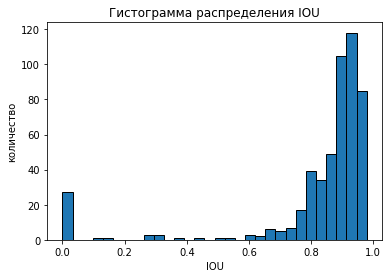

In [ ]:
m_iou
plt.hist (m_iou, bins= 30 , edgecolor='black') 
plt.title('Гистограмма распределения IOU')
plt.xlabel('IOU')
plt.ylabel('количество')
plt.show()

# Визуализация тестовой детекции

In [ ]:
# вывод фото из заданного списка, принадлежащего TEST, фото с TRUE и PRED детекцией
def predict_test_list(test_list, conf_thr=0.1, crop = None):
  W=1
  fig = plt.figure(figsize=(12, 5 * len(test_list)/W), dpi=120)
  for i, filename, in enumerate(test_list):
      filename += '.jpg'
      annotation = boxes_test[filename]
      nom = list(boxes_test.keys()).index(filename)
      pred = pred_test[nom]
      decoded = decode_prediction(pred, conf_thr=conf_thr)
      decoded = non_max_suppression(decoded,
                                    max_output_size=5,
                                    iou_threshold=0.1)
      plt.subplot(len(test_list)//W+1, W, i + 1)
      img = draw_boxes(annotation, decoded, (IMG_WIDTH, IMG_HEIGHT))
      if crop is not None:
        crop_save(annotation, decoded)
      plt.imshow(img)
      #plt.title('Предсказание на тесте {}'.format(filename));
      plt.title('%s' % filename.split('/')[-1]);

In [ ]:
# вывод фото из TEST, фото с TRUE и PRED детекцией. Crop != None - выводить детекцию в файл.
def predict_test(n_start=0, n_kol=10, conf_thr=0.1, crop = None):
  W=3
  fig = plt.figure(figsize=(12, 5 * (n_start+n_kol)/W), dpi=120)
  for i, (filename, annotation) in enumerate(boxes_test.items()):
    if i>=n_start and i<n_start+n_kol:
      pred = pred_test[i]
      decoded = decode_prediction(pred, conf_thr=conf_thr)
      decoded = non_max_suppression(decoded,
                                    max_output_size=5,
                                    iou_threshold=0.1)
      plt.subplot((n_start+n_kol)//W+1, W, i + 1 - n_start)
      img = draw_boxes(annotation, decoded, (IMG_WIDTH, IMG_HEIGHT))
      if crop is not None:
        crop_save(annotation, decoded, type_brick = annotation['rect']['name'])
      plt.imshow(img)
      #plt.title('Предсказание на тесте {}'.format(filename));
      plt.title('%s' % filename.split('/')[-1]);


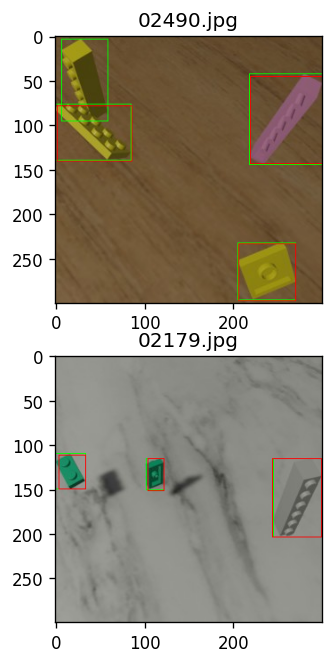

In [ ]:
predict_test_list(['02490', '02179'], crop = None)

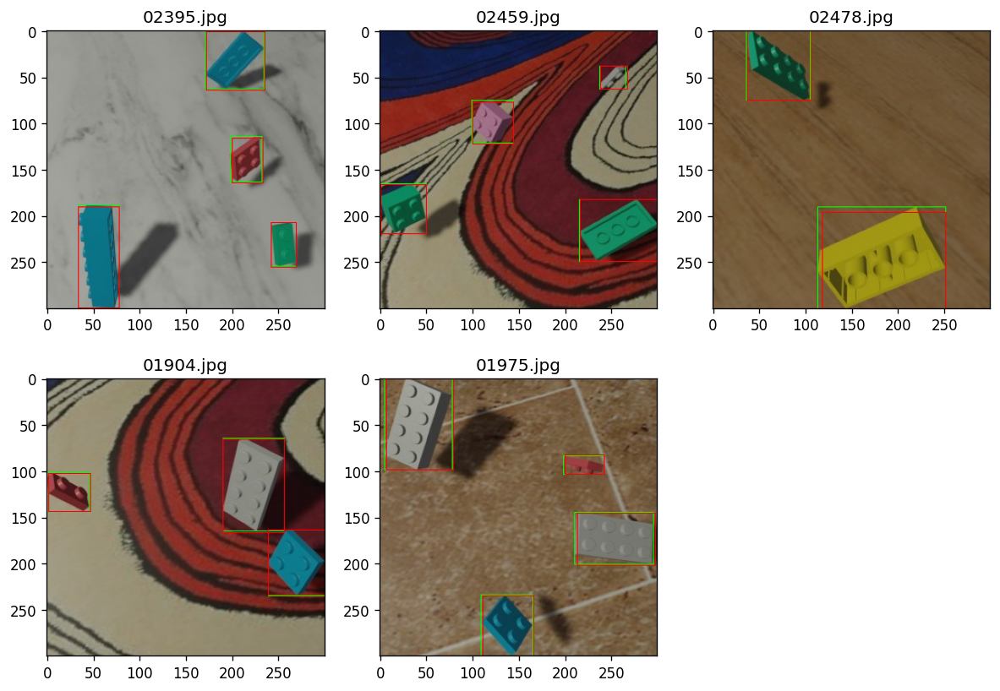

In [ ]:
test_list = ['02395', '02459', '02478', '01904', '01975']#, '02399']
predict_test_list(test_list, crop = None)

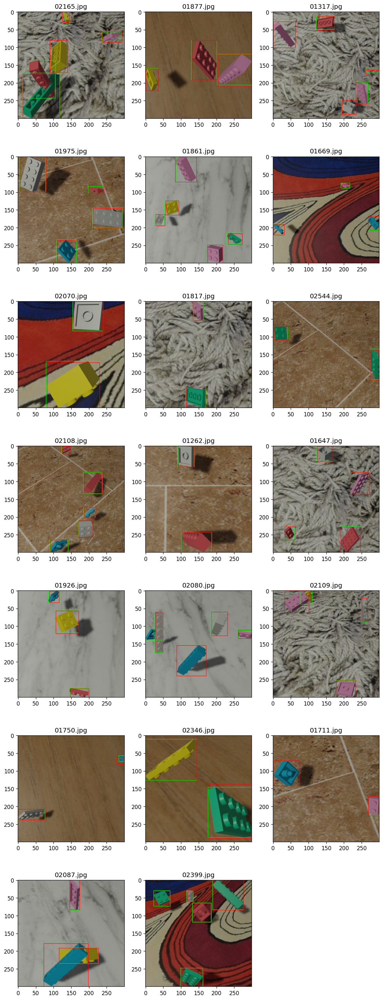

In [ ]:
predict_test(n_start=80, n_kol=20, conf_thr=0.1)

## Расчитываем и визуализируем детекцию на внешних фото

In [ ]:
# Расчет надичия отклонений двух цветов от заданного
def out_dopusk(color0, color1, otkl=0.1):
  dopusk = int(255*otkl)
  if np.abs(color1[0]-color0[0]) > dopusk or \
     np.abs(color1[1]-color0[1]) > dopusk or \
     np.abs(color1[2]-color0[2]) > dopusk:
     return True
  else:
     return False

# Вычесление смещения границы сегмента 
def resize_crop(img, x_0, y_0, x_1, y_1):

    np_img = np.array(img, dtype='int32')

    a=2 # кратность исходного размера данного направления, не более чего менять границу
    b=5 # дополнительно сместить границу в сторону изменения
    t_c = np_img[y_0, x_0]
    k = 0
    while x_0+k>0 and -k<(x_1-x_0)*a:
      e_r = False
      for ii in range(y_0, y_1): #img.shape[1]):
        c = np_img[ii,x_0+k]
        if out_dopusk(c, t_c): e_r = True
        t_c = c
      if e_r: k -= 1
      else: break
    kx0 = k + b*np.sign(k)
    k = 0
    t_c = np_img[y_0, x_0]
    while y_0+k>0 and -k<(y_1-y_0)*a:
      e_r = False
      for ii in range(x_0, x_1): #img.shape[1]):
        c = np_img[y_0+k, ii]
        if out_dopusk(c, t_c): e_r = True
        t_c = c
      if e_r: k -= 1
      else: break
    ky0 = k + b*np.sign(k)
    k = 0
    t_c = np_img[y_0, x_1]
    while x_1+k<img.shape[1] and k<(x_1-x_0)*a:
      e_r = False
      t_c = np_img[y_0, x_1+k]
      for ii in range(y_0, y_1):
        c = np_img[ii,x_1+k]
        if out_dopusk(c, t_c): e_r = True
        #np_img[ii,x_1+k] = (0,255,0)
        t_c = c
      if e_r: k += 1
      else: break
    kx1 = k + b*np.sign(k)
    k = 0
    t_c = np_img[y_1, x_0]
    while y_1+k<img.shape[0] and k<(y_1-y_0)*a:
      e_r = False
      for ii in range(x_0, x_1):
        c = np_img[y_1+k,ii]
        if out_dopusk(c, t_c): e_r = True
        t_c = c
      if e_r: k += 1
      else: break
    ky1 = k + b*np.sign(k)
    
    return kx0, ky0, kx1, ky1

In [ ]:
# вывод в JPG обнаруженных сегментов с предварительным расширением границ 
# test=1 тестовый режим - не писать файл, вернуть изображение с новыми границами
def crop_save2(filename, rectangles=None, test=0):
    
    scale_x, scale_y = 1., 1.
    img = cv2.imread(filename, cv2.IMREAD_COLOR)#[...,::-1]

    xsz = img.shape[1] / IMG_WIDTH
    ysz = img.shape[0] / IMG_HEIGHT

    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    i = 0
    if rectangles is not None:
      for i, rect in enumerate(rectangles):
          x_0 = int((rect['x'] - rect['width'] / 2) * scale_x)
          y_0 = int((rect['y'] - rect['height'] / 2) * scale_y)
          x_1 = int((rect['x'] + rect['width'] / 2) * scale_x)
          y_1 = int((rect['y'] + rect['height'] / 2) * scale_y)
          if x_0 < 0: x_0 = 0
          if y_0 < 0: y_0 = 0
          if x_1 >= img.shape[1]: x_1 = img.shape[1]-1
          if y_1 >= img.shape[0]: y_1 = img.shape[0]-1
          if x_1-x_0 < 20 or y_1-y_0 < 20 or x_1 < 0 or y_1 < 0:
            continue 
          #print (i, x_0, y_0, x_1, y_1)
          # Вычесление смещения границы сегмента 
          kx0, ky0, kx1, ky1 = resize_crop(cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT)), x_0, y_0, x_1, y_1)
          a=1 # бесусловное смещение во все стороны
          x_0 += (kx0-a)
          y_0 += (ky0-a)
          x_1 += (kx1+a)
          y_1 += (ky1+a)

          # x_0 = int(x_0*xsz)
          # x_1 = int(x_1*xsz)
          # y_0 = int(y_0*ysz)
          # y_1 = int(y_1*ysz)

          if x_0 < 0: x_0 = 0
          if y_0 < 0: y_0 = 0
          if x_1 >= img.shape[1]: x_1 = img.shape[1]-1
          if y_1 >= img.shape[0]: y_1 = img.shape[0]-1

          img_crop = img[y_0:y_1, x_0:x_1]

          #print(img_crop.shape, img.shape)
          f = os.path.basename(filename).split('.')
          file_name = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/_' \
            + f[0] + '_' + str(i) + '.' + f[1]
          #print (file_name)
          if test==1:
            return (img_crop)
          else:
            cv2.imwrite(file_name, img_crop)
    
    return i+1

In [ ]:
# Отображение JPG из заданной директории
def show_img(path, n_start=0, n_stop=50):
  if 0> n_stop - n_start > 50 : return
  test_images = glob(path)[n_start:n_stop]
  test_images.sort()
  W=5
  fig = plt.figure(figsize=(12, 5 * len(test_images)/W), dpi=120)
  plt.rc('font', size= 8)
  for i, filename in enumerate(test_images):
    plt.subplot(len(test_images)//W+1, W, i + 1)
    img = cv2.imread(filename, cv2.IMREAD_COLOR)[...,::-1]
    plt.imshow(img)
    plt.title('%s' % filename.split('/')[-1]);


In [ ]:
# Детекция из файлов из заданной директории и визулизация
# Crop != None - обработка границ сегментации и вывод в файл.
def predict_model_grup(path, n_start=0, n_kol=50, conf_thr=0.1, crop=None):
  if n_kol > 50 : return
  test_images = glob(path)[n_start:n_start+n_kol]
  W=5
  fig = plt.figure(figsize=(12, 5 * len(test_images)/W), dpi=120)
  plt.rc('font', size= 6)
  for i, filename in enumerate(test_images):
    #print(filename)
    _, sample_img = load_img(filename)
    pred = model.predict(np.array([sample_img,]))

    decoded = decode_prediction(pred[0], conf_thr=conf_thr)
    decoded = non_max_suppression(decoded,
                                  max_output_size=6,
                                  iou_threshold=0.1)
    
    plt.subplot(len(test_images)//W+1, W, i + 1)
    img = draw_boxes({'filename': filename}, decoded, (IMG_WIDTH, IMG_HEIGHT))
    if crop is not None:
      crop_save2(filename, decoded)
    plt.imshow(img)
    plt.title('%s' % filename.split('/')[-1]);
    #plt.subplot.set_title('%s' % filename.split('/')[-1])

1/1 [==============================] - 0s 22ms/step


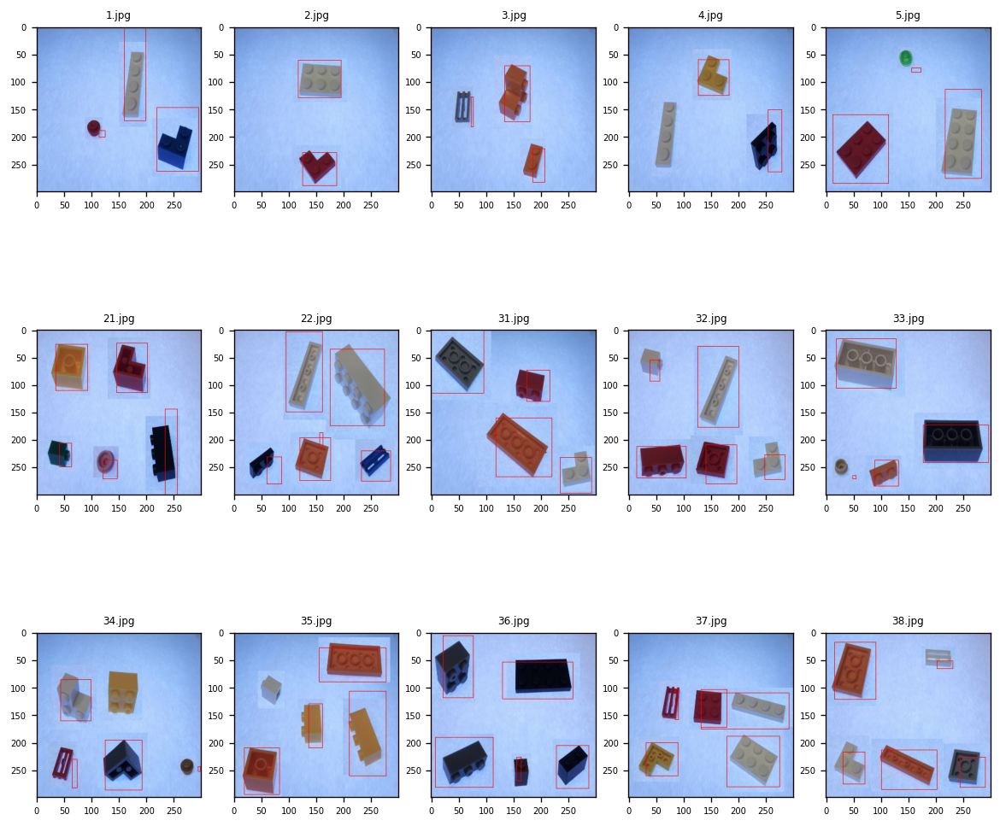

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA2/GROUP2/*.jpg'
predict_model_grup(path, conf_thr=0.1, crop=0)#, n_start=5, n_kol=1)

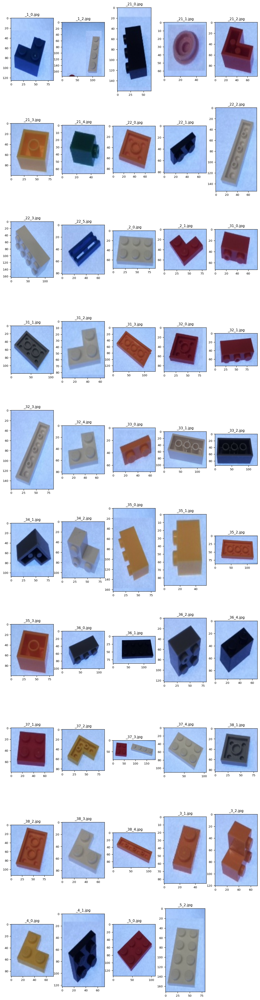

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM//OBMEN/NEW/*.jpg'
show_img(path, n_start=0, n_stop=50)

1/1 [==============================] - 0s 22ms/step


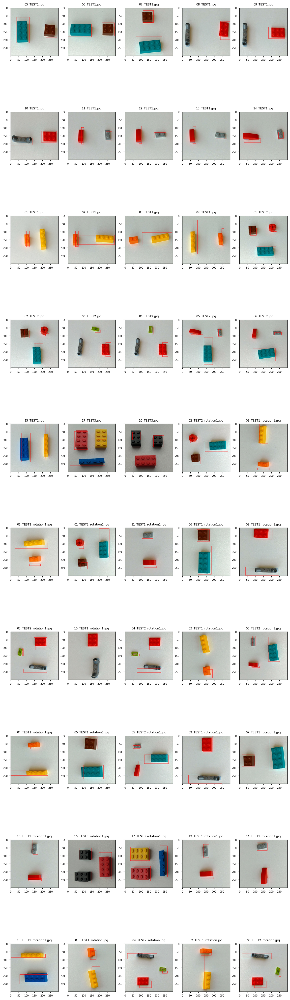

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST/*.jpg'
predict_model_grup(path, conf_thr=0.1, crop=1)#, n_start=5, n_kol=1)

1/1 [==============================] - 0s 35ms/step


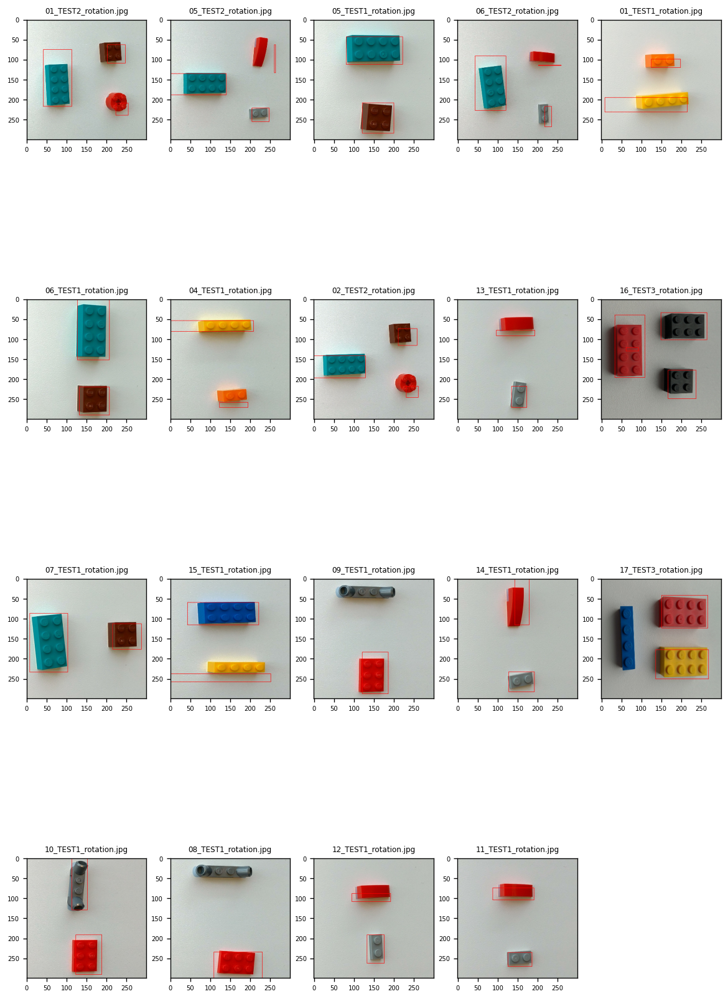

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST/*.jpg'
predict_model_grup(path, conf_thr=0.1, crop=1, n_start=50)#, n_kol=1)

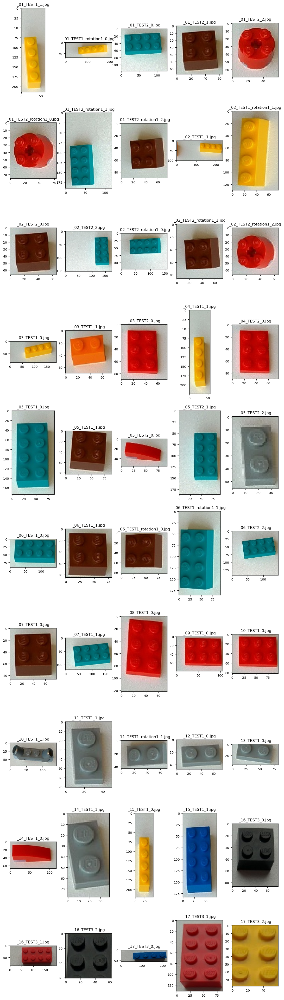

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_img(path, n_start=0, n_stop=50)

1/1 [==============================] - 1s 969ms/step


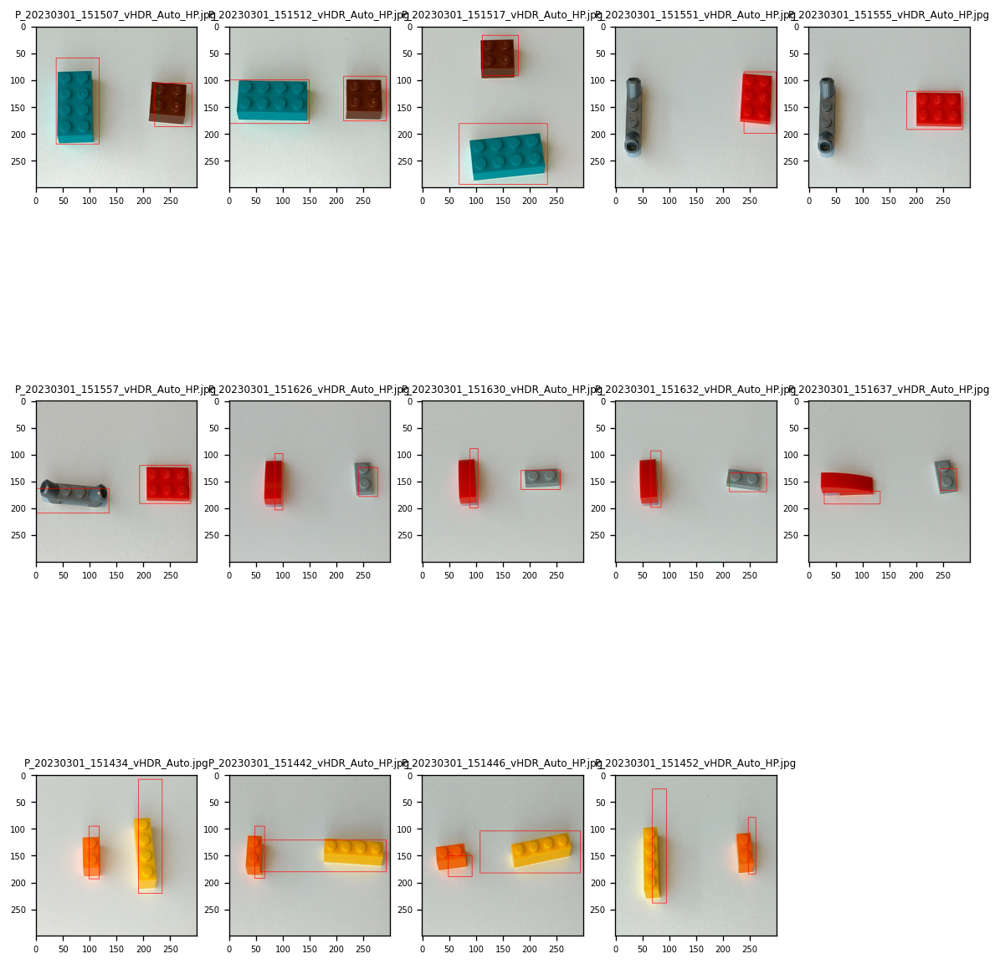

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST2/*.jpg'
predict_model_grup(path, n_start=0, conf_thr=0.05, crop=1)

1/1 [==============================] - 2s 2s/step


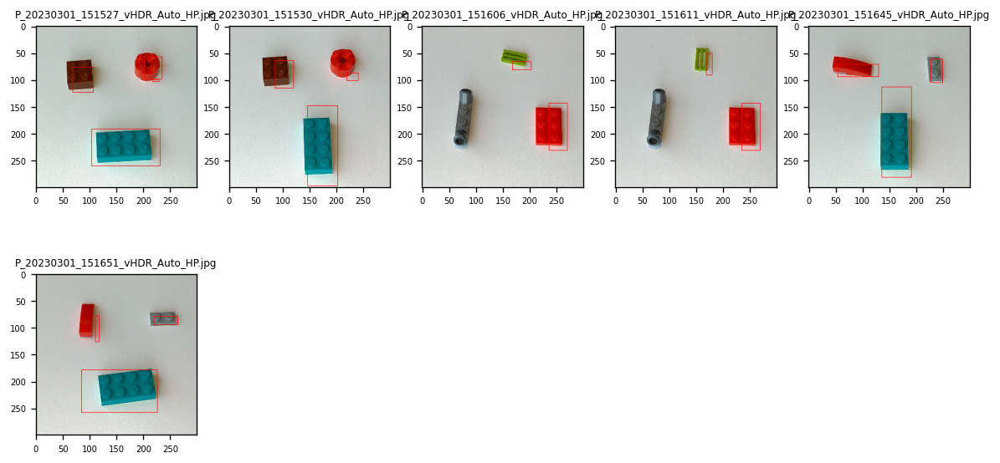

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST3/*.jpg'
predict_model_grup(path, conf_thr=0.05, crop=None)

#Отладка

1/1 [==============================] - 1s 965ms/step


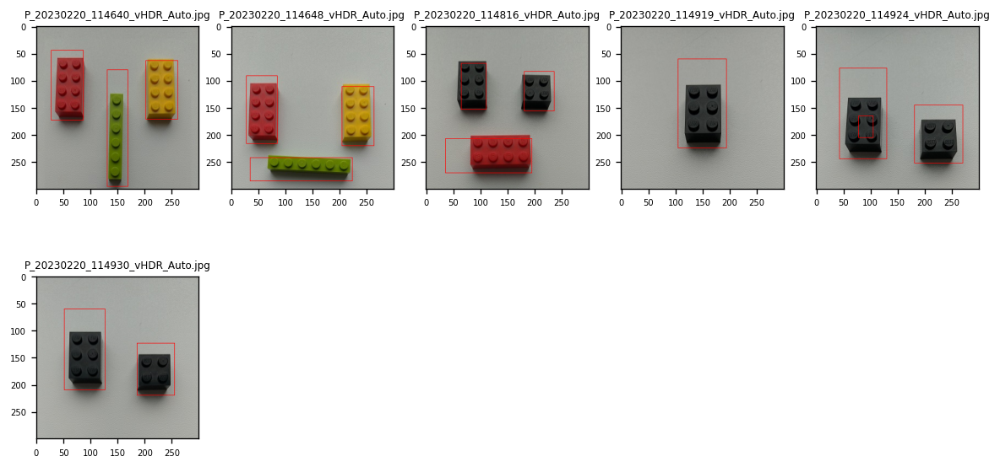

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/OBR300/*.jpg'
predict_model_grup(path, conf_thr=0.1, crop=1)

1/1 [==============================] - 1s 967ms/step
5
{'x': 179.2568572362264, 'y': 79.43013668060303, 'width': 38.90838384628296, 'height': 183.24604034423828, 'conf': 0.18447829282420897}
160 0 198 170
(173, 85, 3) (300, 300, 3)


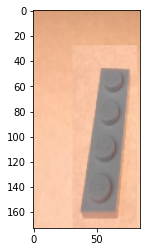

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST2/*.jpg'
#path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/TEST3/*.jpg'
path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA2/GROUP2/*.jpg'

test_images = glob(path)[0]
i=2

#img = cv2.imread(test_images, cv2.IMREAD_COLOR)[...,::-1]
#img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
_, img = load_img(test_images)

pred = model.predict(np.array([img,]))

decoded = decode_prediction(pred[0], conf_thr=0.05)
decoded = non_max_suppression(decoded,
                                  max_output_size=5,
                                  iou_threshold=0.1)

#for i, rect in enumerate(decoded):
print(len(decoded[i]))

rect = decoded[i]
print (rect)
x_0 = int(rect['x'] - rect['width'] // 2)
y_0 = int(rect['y'] - rect['height'] // 2)
x_1 = int(rect['x'] + rect['width'] // 2)
y_1 = int(rect['y'] + rect['height'] // 2)
if x_0 < 0: x_0 = 0
if y_0 < 0: y_0 = 0
if x_1 > img.shape[1]: x_1 = img.shape[1]
if y_1 > img.shape[0]: y_1 = img.shape[0]
print (x_0, y_0, x_1, y_1)

img = cv2.imread(test_images, cv2.IMREAD_COLOR)[...,::-1]
img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))

kx0, ky0, kx1, ky1 = resize_crop(img, x_0, y_0, x_1, y_1)

#img_crop = img[y_0+ky0:y_1+ky1, x_0+kx0:x_1+kx1]
img_crop = crop_save2(test_images, [rect], test=1)

print(img_crop.shape, img.shape)

plt.imshow(img_crop)
#    file_name = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_' \
#      +brick_type + '_' + str(i) + '_' + os.path.basename(Boxes['filename'])


(186, 79)

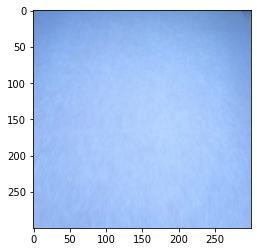

In [ ]:
path_background = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA2/background_backlit_B.jpg'

img_b = cv2.imread(path_background, cv2.IMREAD_COLOR)[...,::-1]
img_b = cv2.resize(img_b, (IMG_HEIGHT, IMG_WIDTH))
color_aver = (np.average(img_b[:,:,0]), np.average(img_b[:,:,1]), np.average(img_b[:,:,2]))
img_aver = img_b.copy()
img_aver[:,:] = color_aver
plt.imshow(img_b)
np.max(img_b[:,:,0]), np.min(img_b[:,:,0]), 

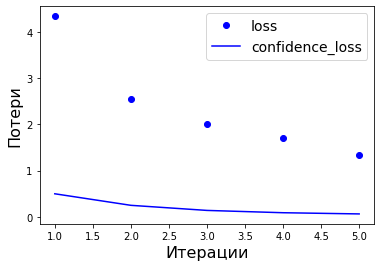

In [ ]:
import matplotlib.pyplot as plt



0.9219858156028369
[5, 110, 34, 150] [5, 112, 35, 150]


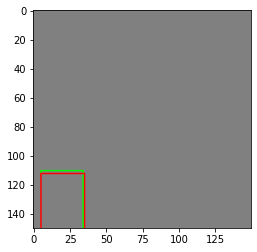

In [ ]:
b=[[[50, 50, 250, 250], [50-5, 50-5, 250+5, 250+5]],
  [[5, 110, 34, 150], [5, 112, 35, 150]]]

b1 = b[1] #recty[10][1]
b2 = b[1] #recty[10][2]
print(_iou(b1[0], b2[1]))
print(b1[0], b2[1])
img = np.zeros((IMG_WIDTH//2, IMG_HEIGHT//2,3), dtype = 'uint8')
img[:,:] = (128,128,128)
pt1 = (int(b1[0][0]), int(b1[0][1]))
pt2 = (int(b1[0][2]), int(b1[0][3]))
#print(pt1, pt2)
img = cv2.rectangle(img, pt1, pt2, color=(0,255,0), thickness=1)
pt1 = (int(b2[1][0]), int(b2[1][1]))
pt2 = (int(b2[1][2]), int(b2[1][3]))
img = cv2.rectangle(img, pt1, pt2, color=(255,0,0), thickness=1)

plt.imshow(img)